In [1]:
%env CUDA_DEVICE_ORDER=PCI_BUS_ID
%env CUDA_VISIBLE_DEVICES=2

env: CUDA_DEVICE_ORDER=PCI_BUS_ID
env: CUDA_VISIBLE_DEVICES=2


In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import os
import numpy as np
import pandas as pd
import cudf as gd
from cuml.manifold.umap import UMAP as cumlUMAP
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.autonotebook import tqdm
from avgn.utils.paths import DATA_DIR, most_recent_subdirectory, ensure_dir

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/autonotebook/__init__.py:14: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


In [4]:
from avgn.utils.paths import FIGURE_DIR, ensure_dir
from avgn.utils.general import save_fig

In [5]:
DATASET_ID = 'buckeye'

In [6]:
window_loc = DATA_DIR / 'umap_windows/buckeye/than_when_then_they_them_that_4.pickle'

In [7]:
words_df = pd.read_pickle(window_loc)

In [8]:
words_df[:3]

,start_time,end_time,word,phones,phone_start_times,phone_end_times,utterance_number,position_in_utterance,word_number,indv,indvi,age,sex,key,rate,spectrogram,windows
4,25.588546,25.778605,they,"[dh, ey]","[0.0, 0.06714699999999851]","[0.06714699999999851, 0.19005899999999798]",10,4,4,s25,0,o,f,s2501b,16000,"[[2, 2, 1, 0, 15, 24, 25, 18, 6, 1, 0, 36, 144...","[[[2, 37, 40, 40, 48, 39, 44, 35, 18, 20, 11, ..."
26,33.108949,33.305837,they,"[dh, ey]","[0.0, 0.08692599999999828]","[0.08692599999999828, 0.19688799999999418]",11,6,6,s25,0,o,f,s2501b,16000,"[[167, 184, 187, 179, 176, 174, 170, 163, 162,...","[[[167, 140, 106, 117, 114, 108, 118, 108, 80,..."
42,41.209772,41.342922,that,"[dh, eh, t]","[0.0, 0.04551800000000128, 0.10583599999999649]","[0.04551800000000128, 0.10583599999999649, 0.1...",32,11,11,s25,0,o,f,s2501b,16000,"[[133, 155, 158, 150, 131, 112, 93, 83, 72, 52...","[[[133, 167, 96, 78, 103, 116, 110, 100, 97, 9..."


In [15]:
len(words_df)

12783

In [9]:
word_group = '_'.join(words_df.word.unique())
word_group

'they_that_then_them_when_than'

In [10]:
FIG_SAVE_LOC = FIGURE_DIR/'umap_seqs' / DATASET_ID / word_group
ensure_dir(FIG_SAVE_LOC)

In [11]:
pd.DataFrame({i:[sum(words_df.indv ==i)] for i in  words_df.indv.unique()})

,s25,s08,s24,s40,s15,s17,s13,s16,s26,s35,...,s32,s01,s14,s28,s29,s31,s39,s04,s33,s21
0,432,392,338,341,279,221,517,669,179,372,...,162,194,349,239,388,262,290,308,234,209


In [12]:
np.unique(np.concatenate(words_df.phones.values))

array(['UNKNOWN', 'aa', 'ae', 'aen', 'ah', 'ahn', 'ao', 'aon', 'aw', 'ay',
       'ayn', 'b', 'ch', 'd', 'dh', 'dx', 'eh', 'ehn', 'em', 'en', 'er',
       'ey', 'eyn', 'f', 'g', 'h', 'hh', 'i', 'ih', 'ihn', 'iy', 'jh',
       'k', 'l', 'm', 'n', 'ng', 'nx', 'ow', 'own', 'p', 'r', 's', 'sh',
       't', 'th', 'tq', 'uh', 'uhn', 'uw', 'uwn', 'v', 'w', 'x', 'y', 'z',
       'zh'], dtype='<U7')

In [13]:
n_windows = [len(row.windows) for idx, row in words_df.iterrows()]
words = np.concatenate([np.repeat(row.word, len(row.windows)) for idx, row in words_df.iterrows()])

In [14]:
n_windows[:5]

[48, 50, 34, 37, 85]

In [16]:
# get beginnings and endings of each sequence
onsets = [0]
offsets = [n_windows[0]-1]
for wd in n_windows[1:]:
    onsets.append(offsets[-1]+1)
    offsets.append(onsets[-1]+wd-1)
onsets[:5], offsets[:5], len(onsets), len(offsets)

([0, 48, 98, 132, 169], [47, 97, 131, 168, 253], 12783, 12783)

In [17]:
{i:sum(words == i) for i in np.unique(words)}

{'than': 14735,
 'that': 283206,
 'them': 49980,
 'then': 51850,
 'they': 134192,
 'when': 40295}

In [18]:
words[:10]

array(['they', 'they', 'they', 'they', 'they', 'they', 'they', 'they',
       'they', 'they'], dtype='<U4')

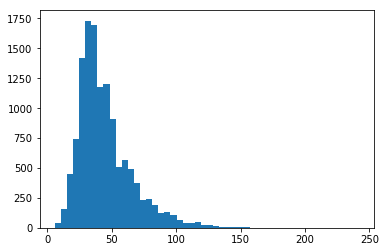

In [19]:
plt.hist(n_windows, bins=50);

In [20]:
rate = 16000

In [21]:
windows = np.vstack(list(words_df.windows))
print(np.shape(windows))
windows = np.reshape(windows, (len(windows), np.prod(np.shape(windows)[1:])))
print(np.shape(windows))

(574258, 1, 32)
(574258, 32)


In [22]:
cuml_umap = cumlUMAP(min_dist = 0.25)
embedding = cuml_umap.fit_transform(windows)

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:1: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 
  """Entry point for launching an IPython kernel.
/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/ipykernel_launcher.py:2: UserWarning: Parameter should_downcast is deprecated, use convert_dtype in fit, fit_transform and transform  methods instead. 
  


(-15, 15)

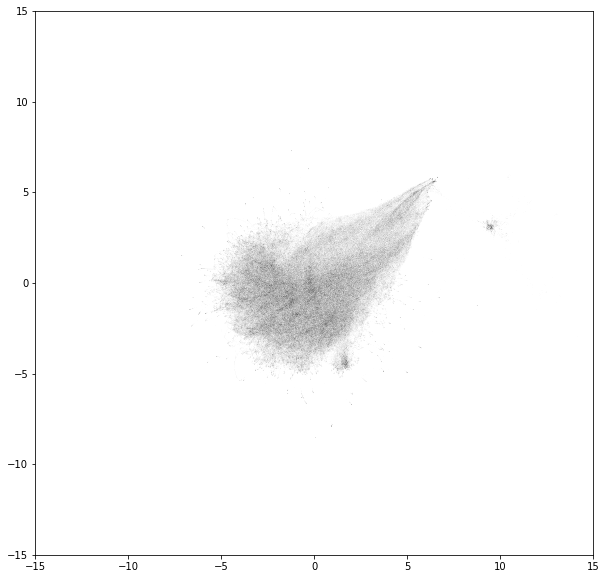

In [25]:
fig, ax = plt.subplots(figsize=(10,10))
ax.scatter(embedding[:,0], embedding[:,1], alpha = 0.0025, s = 1, color='k')
ax.set_xlim([-15,15])
ax.set_ylim([-15,15])

### plot over time

In [31]:
savefig = False

In [32]:
from avgn.visualization.projections import colorline

In [33]:
xlims = [-6,8]
ylims = [-6,6]

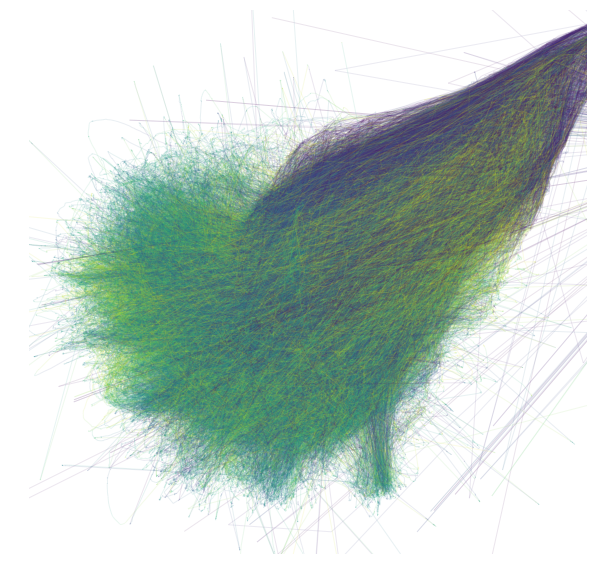

In [29]:
fig, ax = plt.subplots(figsize=(10,10))
#markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in word_pal.values()]
#ax.legend(markers, word_pal.keys(), numpoints=1)


for oi, (on, off) in enumerate(tqdm(zip(onsets, offsets), total=len(offsets))):
    window_z = embedding[on:off,:]
    cols = np.array(sns.color_palette('viridis', len(window_z)))
    #ax.scatter(window_z[:,0], window_z[:,1], alpha = 0.1, s = 1, color=cols)
    colorline(window_z[:,0], window_z[:,1], alpha = 0.01, ax = ax, cmap=plt.cm.viridis, linewidth=1)
    #if oi > 1000:
    #    break
ax.set_xlim(xlims);
ax.set_ylim(ylims);
ax.axis('off')

if savefig: save_fig(FIG_SAVE_LOC / 'trajectory', save_png=True)

### plot by word

In [34]:
len(np.unique(words))

6

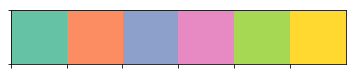

In [35]:
pal = sns.color_palette('Set2', len(np.unique(words)))
sns.palplot(pal)
word_pal = {word:pal[wordi] for wordi, word in enumerate(np.unique(words))}

In [36]:
word_pal

{'than': (0.4, 0.7607843137254902, 0.6470588235294118),
 'that': (0.9882352941176471, 0.5529411764705883, 0.3843137254901961),
 'them': (0.5529411764705883, 0.6274509803921569, 0.796078431372549),
 'then': (0.9058823529411765, 0.5411764705882353, 0.7647058823529411),
 'they': (0.6509803921568628, 0.8470588235294118, 0.32941176470588235),
 'when': (1.0, 0.8509803921568627, 0.1843137254901961)}

In [37]:
cols = [word_pal[i] for i in words]

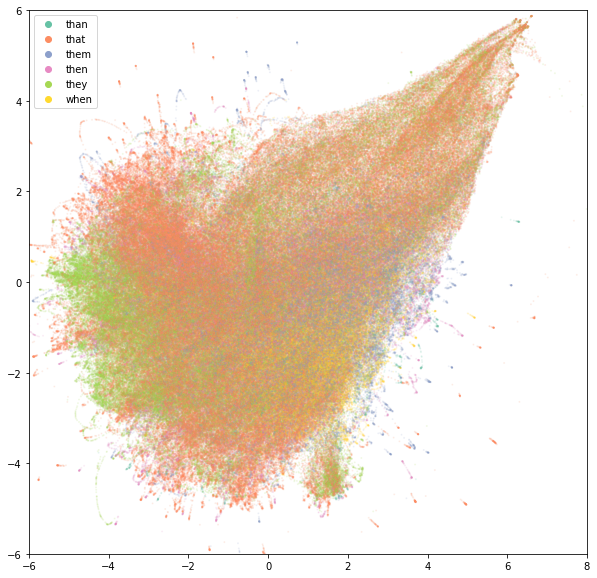

In [38]:
fig, ax = plt.subplots(figsize=(10,10))
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in word_pal.values()]
ax.legend(markers, word_pal.keys(), numpoints=1)

ax.scatter(embedding[:,0], embedding[:,1], alpha = 0.1, s = 1, color=cols)
ax.set_xlim(xlims);
ax.set_ylim(ylims);

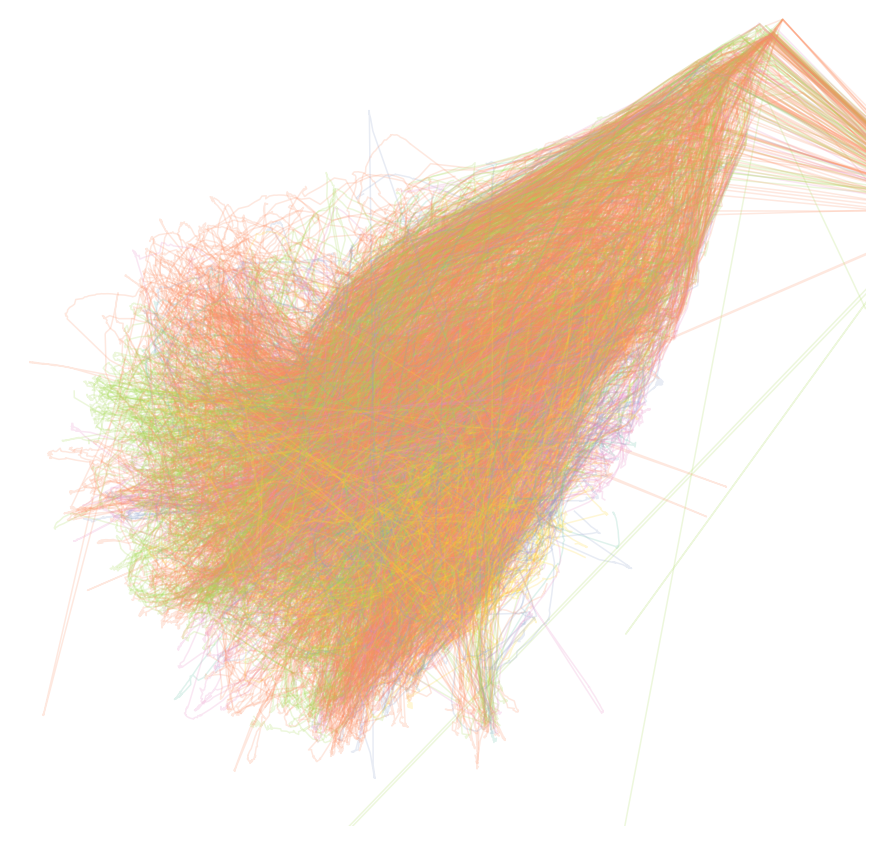

In [39]:
fig, ax = plt.subplots(figsize=(15,15))
#markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in word_pal.values()]
#ax.legend(markers, word_pal.keys(), numpoints=1)

cols = [word_pal[i] for i in words]
for oi, (on, off) in enumerate(tqdm(zip(onsets, offsets), total=len(offsets))):
    window_z = embedding[on:off,:]
    ax.plot(window_z[:,0], window_z[:,1], alpha = 0.2, color=word_pal[words_df.word.values[oi]])
    if oi > 2500:
        break
ax.set_xlim(xlims);
ax.set_ylim(ylims);
ax.axis('off')

if savefig: save_fig(FIG_SAVE_LOC / 'words_trajectory', save_png=True)

### plot the average over each vector for word

In [41]:
from scipy.interpolate import interp1d

In [42]:
#fig, ax = plt.subplots(figsize=(5,5))
word_list = []
word_embedding_list = []
for oi, (word, on, off) in enumerate(tqdm(zip(words_df.word, onsets, offsets), total=len(offsets))):

    window_z = embedding[on:off,:]
    
    word_list.append(word)
    
    f1 = interp1d(np.linspace(0,1, len(window_z)), window_z.T, kind='linear')
    interp_window_z = f1(np.linspace(0,1, 100)).T
    
    word_embedding_list.append(interp_window_z)
    
    #ax.scatter(window_z[:,0], window_z[:,1], alpha = 1, s = 25, color=phone_pal[phone])
    #ax.scatter(interp_window_z[:,0], interp_window_z[:,1], alpha = 1, s = 25, color=phone_pal[phone])
word_embedding_list = np.array(word_embedding_list)
word_list = np.array(word_list)

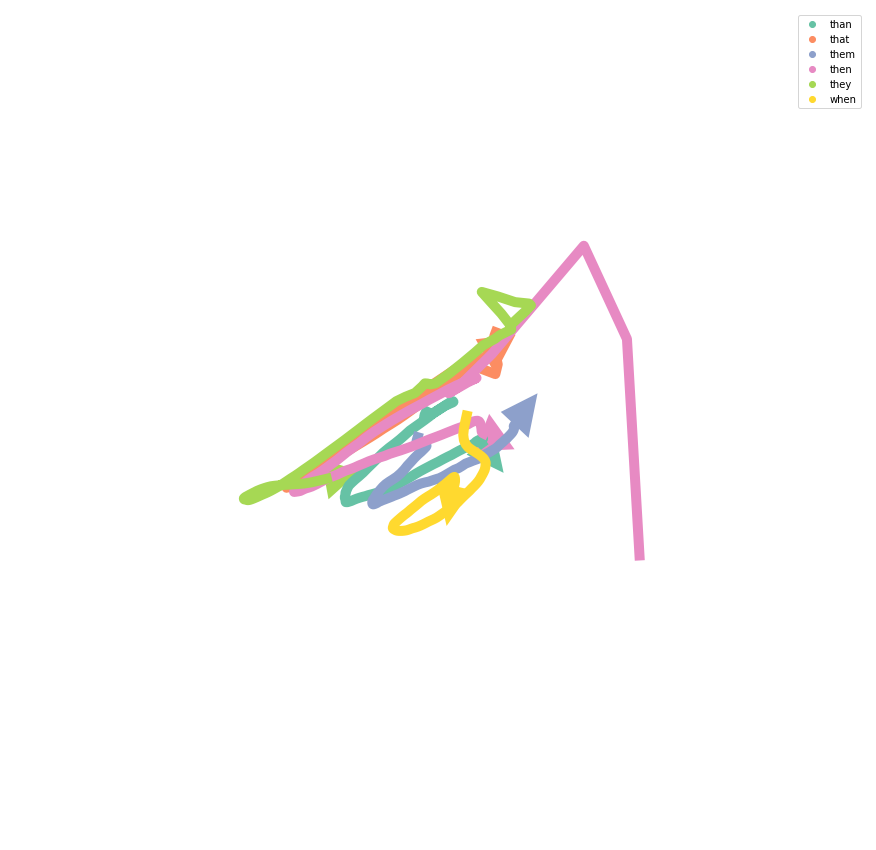

In [43]:
fig, ax = plt.subplots(figsize=(15, 15))
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in word_pal.values()]
ax.legend(markers, word_pal.keys(), numpoints=1)


for word in np.unique(word_list):
    mean_embedding = np.mean(word_embedding_list[word_list == word], axis=0)
    ax.plot(
        mean_embedding[:, 0],
        mean_embedding[:, 1],
        alpha=1,
        lw=10,
        color=word_pal[word],
    )
    ax.arrow(
        mean_embedding[-2, 0],
        mean_embedding[-2, 1],
        #mean_embedding[-1, 0] - mean_embedding[-2, 0],
        #mean_embedding[-1, 1] - mean_embedding[-2, 1],
        mean_embedding[-1, 0] - mean_embedding[-2, 0],
        mean_embedding[-1, 1] - mean_embedding[-2, 1],
        head_width=.5,
        head_length=.5,
        linewidth=4,
        color=word_pal[word],
        length_includes_head=False,
    )

ax.set_xlim(xlims)
ax.set_ylim(ylims)
ax.axis('off')
if savefig: save_fig(FIG_SAVE_LOC / 'words_vector', save_png=True, save_svg=True)

### color by phonemes

In [44]:
#make a list of phones, onsets, and offsets for each phone
# for each word, for each phone, get start time and end time in frames

In [45]:
window_length_ms = 4
hop_length_ms = 4
window_length_frames = int(window_length_ms / hop_length_ms)
window_length_frames

1

In [46]:
phones = []
phone_onsets = []
phone_offsets = []
for wdsi, (idx, row) in tqdm(enumerate(words_df.iterrows()), total= len(words_df)):
    cur_windows = len(row.windows)
    phone_start_frame = [0]
    phone_end_frame = []
    for pi, (phone, pst, pet) in enumerate(zip(row.phones, row.phone_start_times, row.phone_end_times)):
        phone_end_frame.append(int(pet / (window_length_ms / 1000)))
        if pi < len(row.phones)-1:
            phone_start_frame.append(phone_end_frame[-1]+1)
    
    phone_onsets.append(np.array(phone_start_frame) + np.sum([0] + n_windows[:wdsi]))
    phone_offsets.append(np.array(phone_end_frame) + np.sum([0] + n_windows[:wdsi]))
    phones.append(row.phones)
phones = np.concatenate(phones)    
phone_onsets = np.concatenate(phone_onsets)
phone_offsets = np.concatenate(phone_offsets)

In [47]:
print(phones[:15], phone_onsets[:15], phone_offsets[:15])

['dh' 'ey' 'dh' 'ey' 'dh' 'eh' 't' 'n' 'eh' 'n' 'dh' 'eh' 'm' 'dh' 'ey'] [  0  17  48  70  98 110 125 132 137 161 169 186 229 254 262] [ 16  47  69  97 109 124 131 136 160 168 185 228 253 261 276]


In [50]:
common_phones = pd.DataFrame({i:[sum(phones == i)] for i in np.unique(phones)}).T.sort_values(by=0, ascending=False)[:10].T
common_phones

,dh,eh,ae,ey,n,tq,t,ah,ih,w
0,7760,3448,3246,3173,3127,2230,1978,1398,1073,1015


In [51]:
common_phones.columns

Index(['dh', 'eh', 'ae', 'ey', 'n', 'tq', 't', 'ah', 'ih', 'w'], dtype='object')

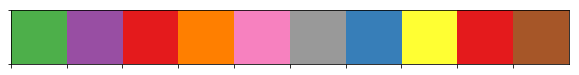

In [52]:
pal = np.random.permutation(sns.color_palette('Set1', len(common_phones.columns)))
sns.palplot(pal)
phone_pal = {word:pal[wordi] for wordi, word in enumerate(common_phones.columns)}

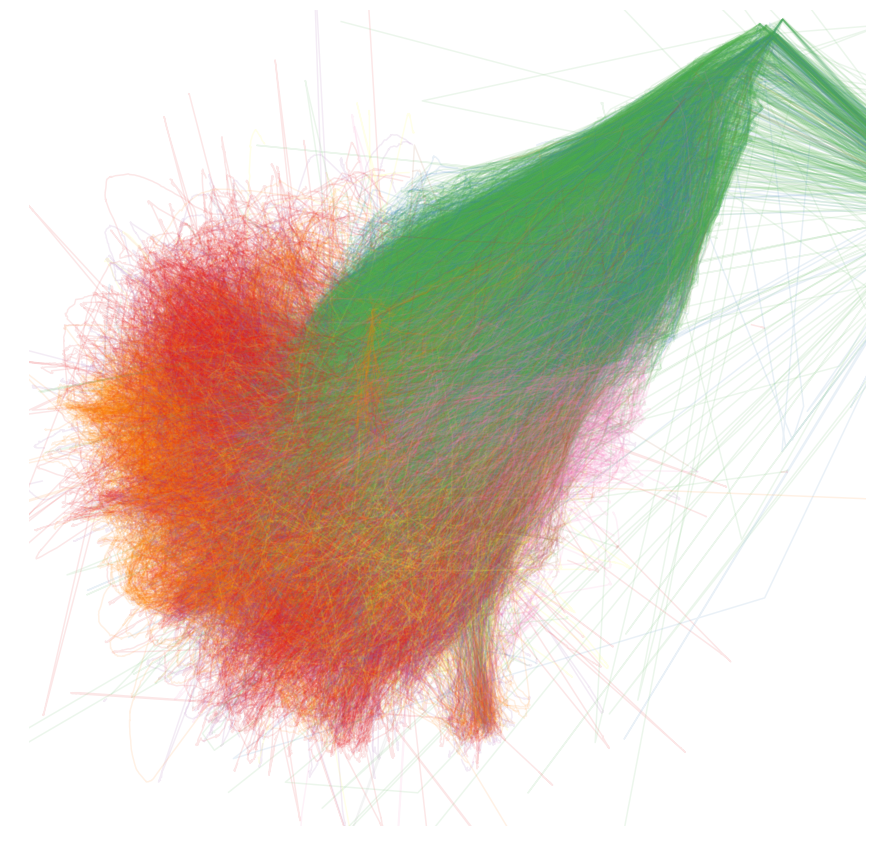

In [54]:
fig, ax = plt.subplots(figsize=(15,15))
#markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in phone_pal.values()]
#ax.legend(markers, phone_pal.keys(), numpoints=1)

for oi, (phone, on, off) in enumerate(tqdm(zip(phones, phone_onsets, phone_offsets), total=len(phone_offsets))):
    if phone not in common_phones.columns:
        continue
    window_z = embedding[on:off,:]
    ax.plot(window_z[:,0], window_z[:,1], alpha = 0.1, color=phone_pal[phone])
    #if oi > 1000:
    #    break
ax.set_xlim(xlims);
ax.set_ylim(ylims);
ax.axis('off')

if savefig: save_fig(FIG_SAVE_LOC / 'phones_trajectory', save_png=True, save_svg=False)

### plot the average vector for each phone

In [55]:
len(np.linspace(0,1, len(window_z)))

12

In [56]:
np.shape(interp_window_z)

(100, 2)

In [57]:
len(window_z)

12

In [59]:
len(window_z)

0

In [60]:
#fig, ax = plt.subplots(figsize=(5,5))
phone_list = []
embedding_list = []
for oi, (phone, on, off) in enumerate(tqdm(zip(phones, phone_onsets, phone_offsets), total=len(phone_offsets))):
    if phone not in common_phones.columns:
        continue
    window_z = embedding[on:off,:]
    if len(window_z) < 2: continue
    phone_list.append(phone)
    
    f1 = interp1d(np.linspace(0,1, len(window_z)), window_z.T, kind='linear')
    interp_window_z = f1(np.linspace(0,1, 100)).T
    
    embedding_list.append(interp_window_z)
    
    #ax.scatter(window_z[:,0], window_z[:,1], alpha = 1, s = 25, color=phone_pal[phone])
    #ax.scatter(interp_window_z[:,0], interp_window_z[:,1], alpha = 1, s = 25, color=phone_pal[phone])
embedding_list = np.array(embedding_list)
phone_list = np.array(phone_list)

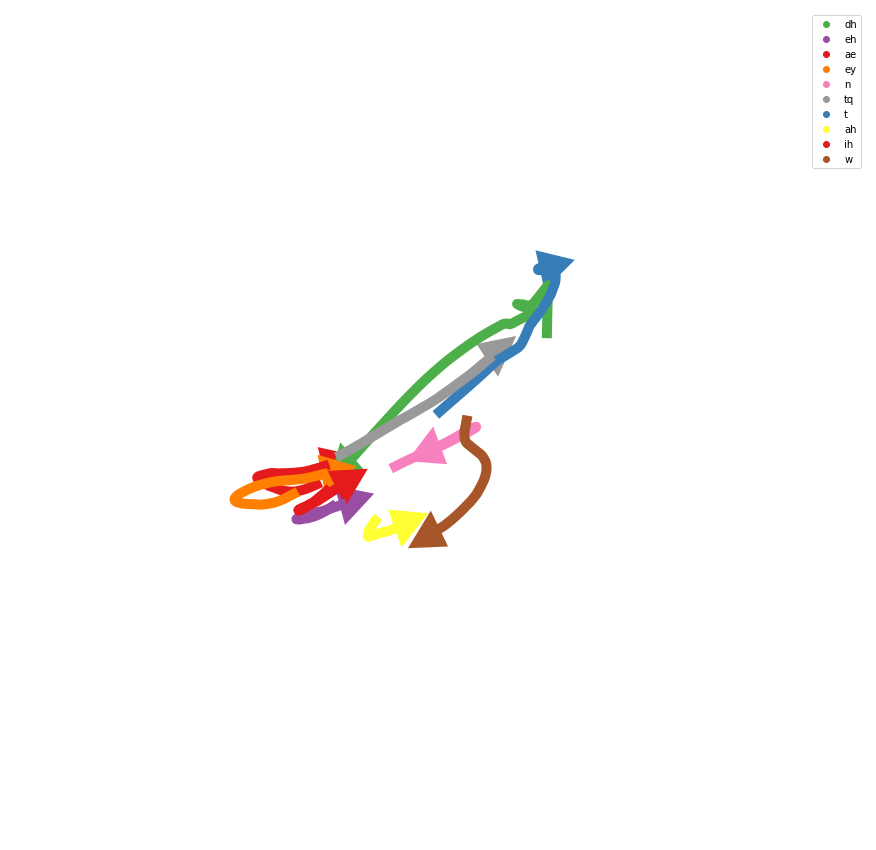

In [61]:
fig, ax = plt.subplots(figsize=(15, 15))
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in phone_pal.values()]
ax.legend(markers, phone_pal.keys(), numpoints=1)


for phone in np.unique(phone_list):
    mean_embedding = np.mean(embedding_list[phone_list == phone], axis=0)
    ax.plot(
        mean_embedding[:, 0],
        mean_embedding[:, 1],
        alpha=1,
        lw=10,
        color=phone_pal[phone],
    )
    ax.arrow(
        mean_embedding[-2, 0],
        mean_embedding[-2, 1],
        #mean_embedding[-1, 0] - mean_embedding[-2, 0],
        #mean_embedding[-1, 1] - mean_embedding[-2, 1],
        mean_embedding[-1, 0] - mean_embedding[-2, 0],
        mean_embedding[-1, 1] - mean_embedding[-2, 1],
        head_width=.5,
        head_length=.5,
        linewidth=4,
        color=phone_pal[phone],
        length_includes_head=False,
    )

ax.set_xlim(xlims)
ax.set_ylim(ylims)
ax.axis('off')

if savefig: save_fig(FIG_SAVE_LOC / 'phones_vector', save_png=True, save_svg=True)

### individual differences

In [62]:
words_df[:3]

,start_time,end_time,word,phones,phone_start_times,phone_end_times,utterance_number,position_in_utterance,word_number,indv,indvi,age,sex,key,rate,spectrogram,windows
4,25.588546,25.778605,they,"[dh, ey]","[0.0, 0.06714699999999851]","[0.06714699999999851, 0.19005899999999798]",10,4,4,s25,0,o,f,s2501b,16000,"[[2, 2, 1, 0, 15, 24, 25, 18, 6, 1, 0, 36, 144...","[[[2, 37, 40, 40, 48, 39, 44, 35, 18, 20, 11, ..."
26,33.108949,33.305837,they,"[dh, ey]","[0.0, 0.08692599999999828]","[0.08692599999999828, 0.19688799999999418]",11,6,6,s25,0,o,f,s2501b,16000,"[[167, 184, 187, 179, 176, 174, 170, 163, 162,...","[[[167, 140, 106, 117, 114, 108, 118, 108, 80,..."
42,41.209772,41.342922,that,"[dh, eh, t]","[0.0, 0.04551800000000128, 0.10583599999999649]","[0.04551800000000128, 0.10583599999999649, 0.1...",32,11,11,s25,0,o,f,s2501b,16000,"[[133, 155, 158, 150, 131, 112, 93, 83, 72, 52...","[[[133, 167, 96, 78, 103, 116, 110, 100, 97, 9..."


In [63]:
indv_count = pd.DataFrame({i:[sum(words_df.indv ==i)] for i in  words_df.indv.unique()}).T.sort_values(by=0, ascending=False)[:20].T
indv_count

,s16,s13,s18,s19,s12,s10,s25,s02,s07,s08,s29,s35,s38,s30,s14,s40,s24,s22,s36,s04
0,669,517,500,471,465,449,432,422,405,392,388,372,371,356,349,341,338,332,317,308


In [64]:
top_indvs = list(indv_count.columns)

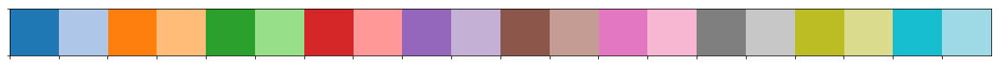

In [65]:
pal = sns.color_palette('tab20', len(top_indvs))
sns.palplot(pal)
indv_pal = {word:pal[wordi] for wordi, word in enumerate(top_indvs)}

In [66]:
#fig, ax = plt.subplots(figsize=(5,5))
indv_list = []
sex_list = []
word_list = []
word_embedding_list = []
for oi, (indv, sex, word, on, off) in enumerate(tqdm(zip(words_df.indv, words_df.sex, words_df.word, onsets, offsets), total=len(offsets))):
    indv = words_df.indv.values[oi]
    if indv not in top_indvs:
        continue
        
    window_z = embedding[on:off,:]
    
    word_list.append(word)
    
    f1 = interp1d(np.linspace(0,1, len(window_z)), window_z.T, kind='linear')
    interp_window_z = f1(np.linspace(0,1, 100)).T
    
    word_embedding_list.append(interp_window_z)
    sex_list.append(sex)
    indv_list.append(indv)
    #ax.scatter(window_z[:,0], window_z[:,1], alpha = 1, s = 25, color=phone_pal[phone])
    #ax.scatter(interp_window_z[:,0], interp_window_z[:,1], alpha = 1, s = 25, color=phone_pal[phone])
word_embedding_list = np.array(word_embedding_list)
word_list = np.array(word_list)
sex_list = np.array(sex_list)
indv_list = np.array(indv_list)

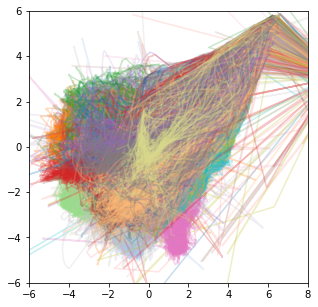

In [67]:
fig, ax = plt.subplots(figsize=(5,5))

cols = [word_pal[i] for i in words]
for oi, (on, off) in enumerate(tqdm(zip(onsets, offsets), total=len(offsets))):
    indv = words_df.indv.values[oi]
    if indv not in top_indvs:
        continue
    #print(indv)
    window_z = embedding[on:off,:]
    ax.plot(window_z[:,0], window_z[:,1], alpha = 0.25, color=indv_pal[indv])
ax.set_xlim(xlims);
ax.set_ylim(ylims);

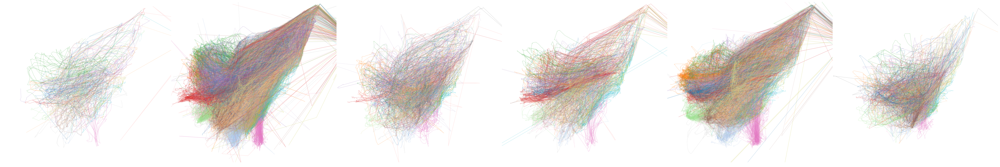

In [68]:
fig, axs = plt.subplots(
    ncols=len(np.unique(word_list)),
    figsize=(15 * len(np.unique(word_list)), 15),
    gridspec_kw={"wspace": 0, "hspace": 0},
)

cols = [word_pal[i] for i in words]
for oi, (on, off) in enumerate(tqdm(zip(onsets, offsets), total=len(offsets))):
    ax = axs.flatten()[np.where(words_df.word.values[oi] == np.unique(word_list))[0][0]]
    indv = words_df.indv.values[oi]
    if indv not in top_indvs:
        continue
    window_z = embedding[on:off, :]
    ax.plot(
        window_z[:, 0],
        window_z[:, 1],
        alpha=0.25,
        color=indv_pal[words_df.indv.values[oi]],
    )
for ax in axs.flatten():
    ax.set_xlim(xlims)
    ax.set_ylim(ylims)
    ax.axis('off')
    
if savefig: save_fig(FIG_SAVE_LOC / 'indv_trajectory', save_png=True, save_svg=False)

In [69]:
from random import sample 

NameError: name 'red_pal' is not defined

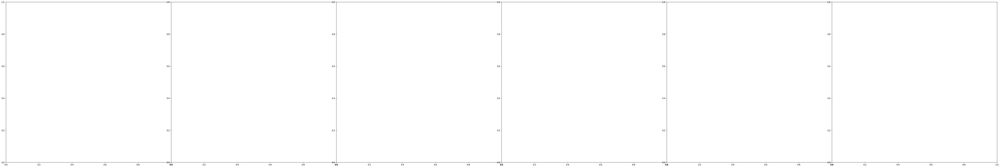

In [70]:
fig, axs = plt.subplots(
    ncols=len(np.unique(word_list)),
    figsize=(15 * len(np.unique(word_list)), 15),
    gridspec_kw={"wspace": 0, "hspace": 0},
)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in word_pal.values()]
"""ax.legend(markers, word_pal.keys(), numpoints=1)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in word_pal.values()]


ax.legend(markers, word_pal.keys(), numpoints=1)

cols = [word_pal[i] for i in words]
for oi, (on, off) in enumerate(tqdm(zip(onsets, offsets), total=len(offsets))):
    window_z = embedding[on:off,:]
    ax.plot(window_z[:,0], window_z[:,1], alpha = 0.1, color=sex_pal[words_df.sex.values[oi]])
    """
for indv in np.unique(indv_list):
    if indv not in top_indvs:
        continue
    sex = words_df[words_df.indv == indv].sex.values[0]
    for wi, word in enumerate(np.unique(word_list)):
        mean_embedding = np.mean(word_embedding_list[(word_list == word) & (indv_list == indv)], axis=0)
        ax = axs.flatten()[wi]
        
        if sex == 'm':
            color = sample(blue_pal, 1)[0]
        else:
            color = sample(red_pal, 1)[0]
        ax.plot(
            mean_embedding[:, 0],
            mean_embedding[:, 1],
            alpha=1,
            lw=8,
            color=indv_pal[indv], #color, #sex_pal[sex],#indv_pal[indv],
            #ls = {'m': 'dotted', 'f':'dashed'}[sex]
        )
        ax.arrow(
            mean_embedding[-2, 0],
            mean_embedding[-2, 1],
            #mean_embedding[-1, 0] - mean_embedding[-2, 0],
            #mean_embedding[-1, 1] - mean_embedding[-2, 1],
            mean_embedding[-1, 0] - mean_embedding[-2, 0],
            mean_embedding[-1, 1] - mean_embedding[-2, 1],
            head_width=.25,
            head_length=.25,
            linewidth=4,
            color=indv_pal[indv], #color, #sex_pal[sex],#indv_pal[indv],
            length_includes_head=False,
        )
        #ax.set_title(word)
        ax.set_xlim(xlims)
        ax.set_ylim(ylims)
        ax.axis('off')
if savefig: save_fig(FIG_SAVE_LOC / 'indv_vector', save_png=True, save_svg=True)

In [ ]:
blue_pal = sns.color_palette('Purples', 20)[5:]
red_pal = sns.color_palette('Greens', 20)[5:]
sns.palplot(blue_pal)
sns.palplot(red_pal)

In [ ]:
fig, axs = plt.subplots(
    ncols=len(np.unique(word_list)),
    figsize=(15 * len(np.unique(word_list)), 15),
    gridspec_kw={"wspace": 0, "hspace": 0},
)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in word_pal.values()]
"""ax.legend(markers, word_pal.keys(), numpoints=1)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in word_pal.values()]


ax.legend(markers, word_pal.keys(), numpoints=1)

cols = [word_pal[i] for i in words]
for oi, (on, off) in enumerate(tqdm(zip(onsets, offsets), total=len(offsets))):
    window_z = embedding[on:off,:]
    ax.plot(window_z[:,0], window_z[:,1], alpha = 0.1, color=sex_pal[words_df.sex.values[oi]])
    """
for indv in np.unique(indv_list):
    if indv not in top_indvs:
        continue
    sex = words_df[words_df.indv == indv].sex.values[0]
    for wi, word in enumerate(np.unique(word_list)):
        mean_embedding = np.mean(word_embedding_list[(word_list == word) & (indv_list == indv)], axis=0)
        ax = axs.flatten()[wi]
        
        if sex == 'm':
            color = sample(blue_pal, 1)[0]
        else:
            color = sample(red_pal, 1)[0]
        ax.plot(
            mean_embedding[:, 0],
            mean_embedding[:, 1],
            alpha=1,
            lw=8,
            color=color, #sex_pal[sex],#indv_pal[indv],
            #ls = {'m': 'dotted', 'f':'dashed'}[sex]
        )
        ax.arrow(
            mean_embedding[-2, 0],
            mean_embedding[-2, 1],
            #mean_embedding[-1, 0] - mean_embedding[-2, 0],
            #mean_embedding[-1, 1] - mean_embedding[-2, 1],
            mean_embedding[-1, 0] - mean_embedding[-2, 0],
            mean_embedding[-1, 1] - mean_embedding[-2, 1],
            head_width=.25,
            head_length=.25,
            linewidth=4,
            color=color, #sex_pal[sex],#indv_pal[indv],
            length_includes_head=False,
        )
        #ax.set_title(word)
        ax.set_xlim(xlims)
        ax.set_ylim(ylims)
        ax.axis('off')
if savefig: save_fig(FIG_SAVE_LOC / 'indv_sex_vector', save_png=True, save_svg=True)

### sex differences

In [ ]:
words_df[:3]

In [ ]:
pal = [red_pal[8], blue_pal[8]]
sns.palplot(pal)
sex_pal = {word:pal[wordi] for wordi, word in enumerate(np.unique(words_df.sex))}

In [ ]:
fig, axs = plt.subplots(ncols = len(np.unique(word_list)), figsize=(5*len(np.unique(word_list)), 5))

cols = [word_pal[i] for i in words]
for oi, (on, off) in enumerate(tqdm(zip(onsets, offsets), total=len(offsets))):
    ax = axs.flatten()[np.where(words_df.word.values[oi] == np.unique(word_list))[0][0]]
    window_z = embedding[on:off,:]
    ax.plot(window_z[:,0], window_z[:,1], alpha = 0.1, color=sex_pal[words_df.sex.values[oi]])
    #if oi > 1000:
    #    break
for ax in axs.flatten():
    ax.set_xlim(xlims);
    ax.set_ylim(ylims);

In [ ]:
#fig, ax = plt.subplots(figsize=(5,5))
sex_list = []
word_list = []
word_embedding_list = []
for oi, (sex, word, on, off) in enumerate(tqdm(zip(words_df.sex, words_df.word, onsets, offsets), total=len(offsets))):

    window_z = embedding[on:off,:]
    
    word_list.append(word)
    
    f1 = interp1d(np.linspace(0,1, len(window_z)), window_z.T, kind='linear')
    interp_window_z = f1(np.linspace(0,1, 100)).T
    
    word_embedding_list.append(interp_window_z)
    sex_list.append(sex)
    #ax.scatter(window_z[:,0], window_z[:,1], alpha = 1, s = 25, color=phone_pal[phone])
    #ax.scatter(interp_window_z[:,0], interp_window_z[:,1], alpha = 1, s = 25, color=phone_pal[phone])
word_embedding_list = np.array(word_embedding_list)
word_list = np.array(word_list)
sex_list = np.array(sex_list)

In [ ]:
fig, axs = plt.subplots(
    ncols=len(np.unique(word_list)),
    figsize=(15 * len(np.unique(word_list)), 15),
    gridspec_kw={"wspace": 0, "hspace": 0},
)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in word_pal.values()]
"""ax.legend(markers, word_pal.keys(), numpoints=1)
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in word_pal.values()]


ax.legend(markers, word_pal.keys(), numpoints=1)

cols = [word_pal[i] for i in words]
for oi, (on, off) in enumerate(tqdm(zip(onsets, offsets), total=len(offsets))):
    window_z = embedding[on:off,:]
    ax.plot(window_z[:,0], window_z[:,1], alpha = 0.1, color=sex_pal[words_df.sex.values[oi]])
    """
for sex in np.unique(sex_list):
    for wi, word in enumerate(np.unique(word_list)):
        mean_embedding = np.mean(word_embedding_list[(word_list == word) & (sex_list == sex)], axis=0)
        ax = axs.flatten()[wi]
        ax.plot(
            mean_embedding[:, 0],
            mean_embedding[:, 1],
            alpha=1,
            lw=15,
            color=sex_pal[sex],
            #ls = {'m': 'dotted', 'f':'dashed'}[sex]
        )
        ax.arrow(
            mean_embedding[-2, 0],
            mean_embedding[-2, 1],
            #mean_embedding[-1, 0] - mean_embedding[-2, 0],
            #mean_embedding[-1, 1] - mean_embedding[-2, 1],
            mean_embedding[-1, 0] - mean_embedding[-2, 0],
            mean_embedding[-1, 1] - mean_embedding[-2, 1],
            head_width=.5,
            head_length=.5,
            linewidth=4,
            color=sex_pal[sex],
            length_includes_head=False,
        )
        #ax.set_title(word)
        ax.set_xlim(xlims)
        ax.set_ylim(ylims)
        ax.axis('off')
if savefig: save_fig(FIG_SAVE_LOC / 'sex_vector', save_png=True, save_svg=True)

### spectrograms vs embeddings in colorspace

In [ ]:
# plot segment labels alongside phone labels

In [ ]:
import copy

In [ ]:
def norm(x):
    return (x-np.min(x))/(np.max(x)-np.min(x))

In [ ]:
z_normed = copy.deepcopy(embedding)
plt.hist(z_normed[:,0], bins = np.linspace(-10,10, 50), alpha = 0.5);
plt.hist(z_normed[:,1], bins = np.linspace(-10,10, 50), alpha = 0.5);

In [ ]:
xlims = [-5,5]
ylims = [-5,5]

In [ ]:
z_normed[:,0][z_normed[:,0] > xlims[1]] = xlims[1]
z_normed[:,0][z_normed[:,0] < xlims[0]] = xlims[0]
z_normed[:,1][z_normed[:,1] > ylims[1]] = ylims[1]
z_normed[:,1][z_normed[:,1] < ylims[0]] = ylims[0]

z_normed[:,0] = norm(z_normed[:,0])
z_normed[:,1] = norm(z_normed[:,1])

In [ ]:
window_z = z_normed
R = 1-norm(window_z[:,0])#*.75 + .25
G = 1-norm(window_z[:,1])#*.75 + .25
B = np.ones_like(G)*.5
RGB = np.dstack((R,G,B))
RGB = [list(i) for i in np.nan_to_num(np.squeeze(RGB))]
rgb_img = np.expand_dims(RGB,0)

In [ ]:
phone_pal

In [ ]:
np.shape(rgb_img)

In [ ]:
import matplotlib.patches as mpatches
from matplotlib.collections import PatchCollection
from matplotlib import gridspec

In [ ]:
ncols = 10
for wi, word in enumerate(words_df.word.unique()):
    
    fig = plt.figure(figsize=((ncols)*3, 2.5)) 
    gs = gridspec.GridSpec(2, ncols, height_ratios=[1, 5]) 
    gs.update(wspace=0.025, hspace=0)
    
    for ci,col in enumerate(range(ncols)):
       
    
        row = words_df[words_df.word == word].iloc[col]
        
        while np.all([i in phone_pal for i in row.phones]) == False:
            col = col + 1
            row = words_df[words_df.word == word].iloc[col]
        
        ### plot projections
        ax = plt.subplot(gs[0, ci]) #axs[col]
        # subset embedding 
        on = onsets[np.where(words_df.index == row.name)[0][0]]
        off = offsets[np.where(words_df.index == row.name)[0][0]]

        ax.imshow(rgb_img[:,on:off, :], aspect='auto')
        
        ax.axis('off')
        ### plot spec
        ax = plt.subplot(gs[1, ci]) #axs[col]
        if ci == 0: 
            ax.set_ylabel(word, fontsize=32)
            ax.yaxis.set_label_coords(-0.05,.65)
        spec = row.spectrogram
        ax.matshow(spec, aspect='auto', origin='lower', extent = [0, row.end_time - row.start_time, 0,1], cmap = plt.cm.afmhot)
        ax.set_ylim([-.3,1])
        for spine in ax.spines:
            ax.spines[spine].set_visible(False)
        for phone, st, et in zip(row.phones, row.phone_start_times, row.phone_end_times):
            
            ax.add_patch(
            mpatches.Rectangle(
                [st, -.3],
                et - st,
                .3,
                ec="none",
                color=phone_pal[phone],
            )
            )
            ax.text((st + et)/2, -.2, phone, color='w', fontsize=20, horizontalalignment='center', weight='bold')
            
        ax.set_xticks([])
        ax.set_yticks([])
        #ax.axis('off')
    if savefig: save_fig(FIG_SAVE_LOC / ('spec_' + word), save_png=True, save_svg=True)
    plt.show()

In [ ]:
spine

In [ ]:
row